#<center><b>Customer Personality Analysis<b></center>

**Customer Personality Analysis is a detailed analysis of a company's ideal customers.It helps a business to modify its product based on its target customers from different types of customer segments.**

<center><img src="https://sarasanalytics.com/wp-content/uploads/2023/02/Customer-Segmentation.png" alt="Customer Segmentation" style="margin-left: 105%; float: center;  border:6px solid ; width:80%; height : 70%;"</center>

# **Target :**
- Need to perform clustering to summarize customer segments

## <strong>Importing libraries</strong>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')

## <strong>Importing Dataset </strong>

In [2]:
data=pd.read_excel('/content/marketing_campaign1.xlsx')
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,5,0,0,0,0,0,0,3,11,0


In [3]:
#To see all columns
pd.set_option("display.max.columns",None)
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [4]:
data.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   ID                   2240 non-null   int64         
 1   Year_Birth           2240 non-null   int64         
 2   Education            2240 non-null   object        
 3   Marital_Status       2240 non-null   object        
 4   Income               2216 non-null   float64       
 5   Kidhome              2240 non-null   int64         
 6   Teenhome             2240 non-null   int64         
 7   Dt_Customer          2240 non-null   datetime64[ns]
 8   Recency              2240 non-null   int64         
 9   MntWines             2240 non-null   int64         
 10  MntFruits            2240 non-null   int64         
 11  MntMeatProducts      2240 non-null   int64         
 12  MntFishProducts      2240 non-null   int64         
 13  MntSweetProducts     2240 non-nul

**Basic Data Exploration(Understanding the Dataset)**

The attributes of this data set are as follows:

**People**
- ID: Customer's unique identifier
- Year_Birth: Customer's birth year
- Education: Customer's education level
- Marital_Status: Customer's marital status
- Income: Customer's yearly household income
- Kidhome: Number of children in customer's household
- Teenhome: Number of teenagers in customer's household
- Dt_Customer: Date of customer's enrollment with the company
- Recency: Number of days since customer's last purchase
- Complain: 1 if the customer complained in the last 2 years, 0 otherwise

**Products**
- MntWines: Amount spent on wine in last 2 years
- MntFruits: Amount spent on fruits in last 2 years
- MntMeatProducts: Amount spent on meat in last 2 years
- MntFishProducts: Amount spent on fish in last 2 years
- MntSweetProducts: Amount spent on sweets in last 2 years
- MntGoldProds: Amount spent on gold in last 2 years

**Promotion**
- NumDealsPurchases: Number of purchases made with a discount
- AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
- AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
- AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
- AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
- AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
- Response: 1 if customer accepted the offer in the last campaign, 0 otherwise

**Place**
- NumWebPurchases: Number of purchases made through the company’s website
- NumCatalogPurchases: Number of purchases made using a catalogue
- NumStorePurchases: Number of purchases made directly in stores
- NumWebVisitsMonth: Number of visits to company’s website in the last month


In [6]:
data.shape

(2240, 29)

In [7]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

## **Data Cleaning**

**Checking Null values**

In [8]:
data.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

**Data Preparation**:

**Months Since Enrollment**

In [9]:
data['Dt_Customer']=pd.to_datetime(data['Dt_Customer'])
data['Month_Customer']=(2015-data.Dt_Customer.dt.year)*12+(1-data.Dt_Customer.dt.month)

**Age of the customers**

In [10]:
data['Age']=2015-data['Year_Birth']              #max(data['Age]) is 130

**Age Groups**

In [11]:
data.loc[(data['Age'] >= 13) & (data['Age'] <= 19), 'Age_group'] = 'Teen'
data.loc[(data['Age'] >= 20) & (data['Age']<= 29), 'Age_group'] = 'Young Adult'
data.loc[(data['Age'] >= 30) & (data['Age'] <= 39), 'Age_group'] = 'Middle Age Adult'
data.loc[(data['Age'] >= 40) & (data['Age'] <= 49), 'Age_group'] = 'Senior Age Adult'
data.loc[(data['Age'] >= 50) & (data['Age'] <= 69), 'Age_group'] = 'Old Age Adult'
data.loc[data['Age'] >= 70, 'Age_group']  = 'Very Old Adult'

**Number of Children**

In [12]:
data['Children']=data['Kidhome']+data['Teenhome']

**Renaming Marital Status**

In [13]:
data['Marital_Status']=data['Marital_Status'].replace(
    {'Married':'Couple',
     'Together':'Couple',
     'Single':'Single',
     'Divorced':'Single',
     'Widow':'Single',
     'Alone':'Single',
     'Absurd':'Single',
     'YOLO':'Single',
    })

**Feature pertaining parenthood**

In [14]:
data["Is_Parent"] = np.where(data.Children> 0, 1, 0)

**Feature for total members in the family**

In [15]:
data["Family_Size"] = data['Marital_Status'].replace({'Single': 1, 'Couple':2})+ data["Children"]

**Total Spending**

In [16]:
data=data.rename(columns={'MntWines':'Wines',
                  'MntFruits':'Fruits',
                  'MntMeatProducts':'Meat',
                  'MntFishProducts':'Fish',
                  'MntSweetProducts':'Sweets',
                  'MntGoldProds':'Gold'})

#Total amount spend
data['Spent']=data['Wines']+data['Fruits']+data['Meat']+data['Fish']+data['Sweets']+data['Gold']

In [17]:
data.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Month_Customer', 'Age', 'Age_group', 'Children', 'Is_Parent',
       'Family_Size', 'Spent'],
      dtype='object')

**Average Spent per Purchase**

In [18]:
data['Average_Spent']=(data['Wines']+data['Fruits']+data['Meat']+data['Fish']+data['Sweets']+data['Gold'])/6

**Total Campaign Accepted**

In [19]:
data['Total_Compaign_Accepted']=data['AcceptedCmp1']+data['AcceptedCmp2']+data['AcceptedCmp3']+data['AcceptedCmp4']+data['AcceptedCmp5']

**Average Monthly Visits to the Company's Websites**

In [20]:
data['Avg_web_visits']=data['NumWebVisitsMonth']/12

**Check data duplicated**

In [21]:
data.duplicated().sum()

0

##**Exploratory Data Analysis**

<Axes: ylabel='Age'>

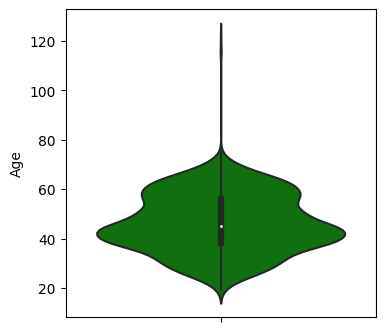

In [22]:
plt.figure(figsize=(4,4))
sns.violinplot(data=data,y='Age',color='green')

- Overall, Most of our customers lie between the age of 38 to 58.

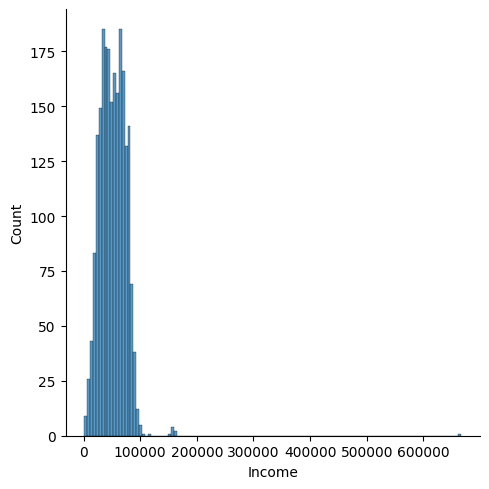

In [23]:
sns.displot(data.Income)

- An outlier at Income>600000.

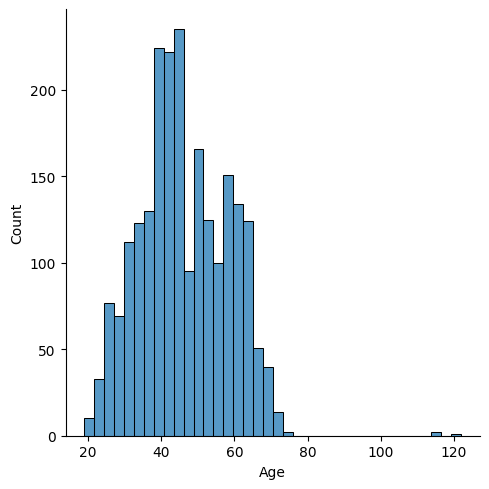

In [24]:
sns.displot(data.Age)

- Three Datapoints that are outliers above the age of 90.

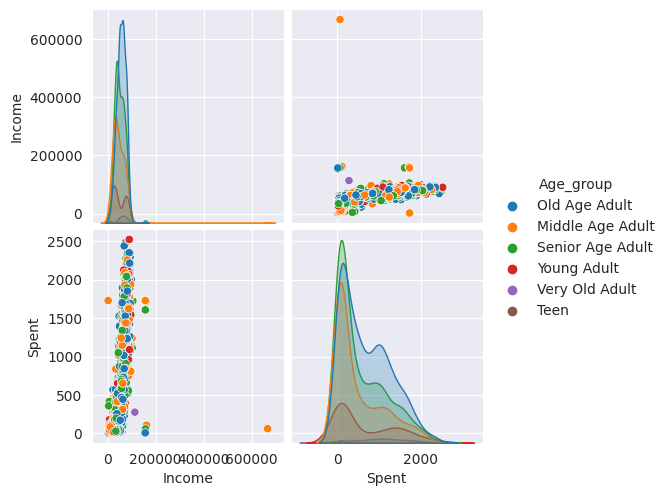

In [25]:
cols=['Age_group','Income','Spent']

sns.set_style('darkgrid')
sns.pairplot(data[cols],hue ='Age_group')
plt.show()

* Old aged Adults have the Higest Income of all.
*Senior Age Adult Spend the most of all.



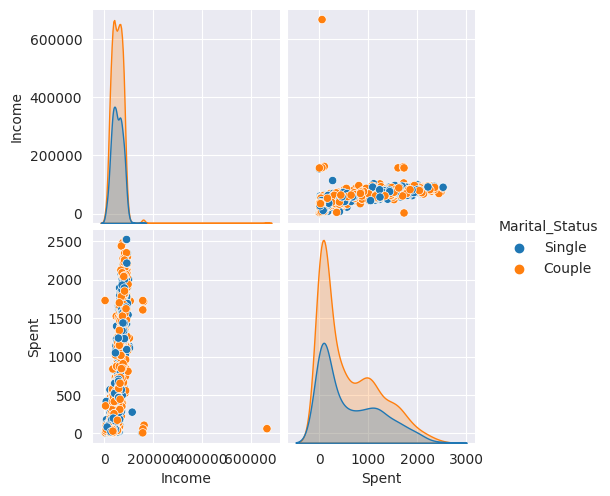

In [26]:
cols=['Income','Spent','Marital_Status' ]

sns.set_style('darkgrid')
sns.pairplot(data[cols],hue ='Marital_Status')
plt.show()

- Customers who are Partners have highest total spendings and income.

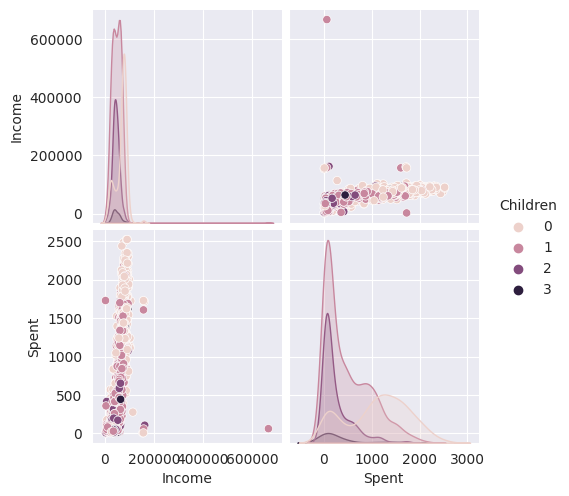

In [27]:
cols=['Income','Spent','Children' ]

sns.set_style('darkgrid')
sns.pairplot(data[cols],hue ='Children')
plt.show()

- Customers who have no children spend less.
- Some customers who have no kids have higher income than customers having 2 children.
- Customers with 3 children earn the lowest and spend the lowest.
- Cusotmers with 1 child earn and spend the most.

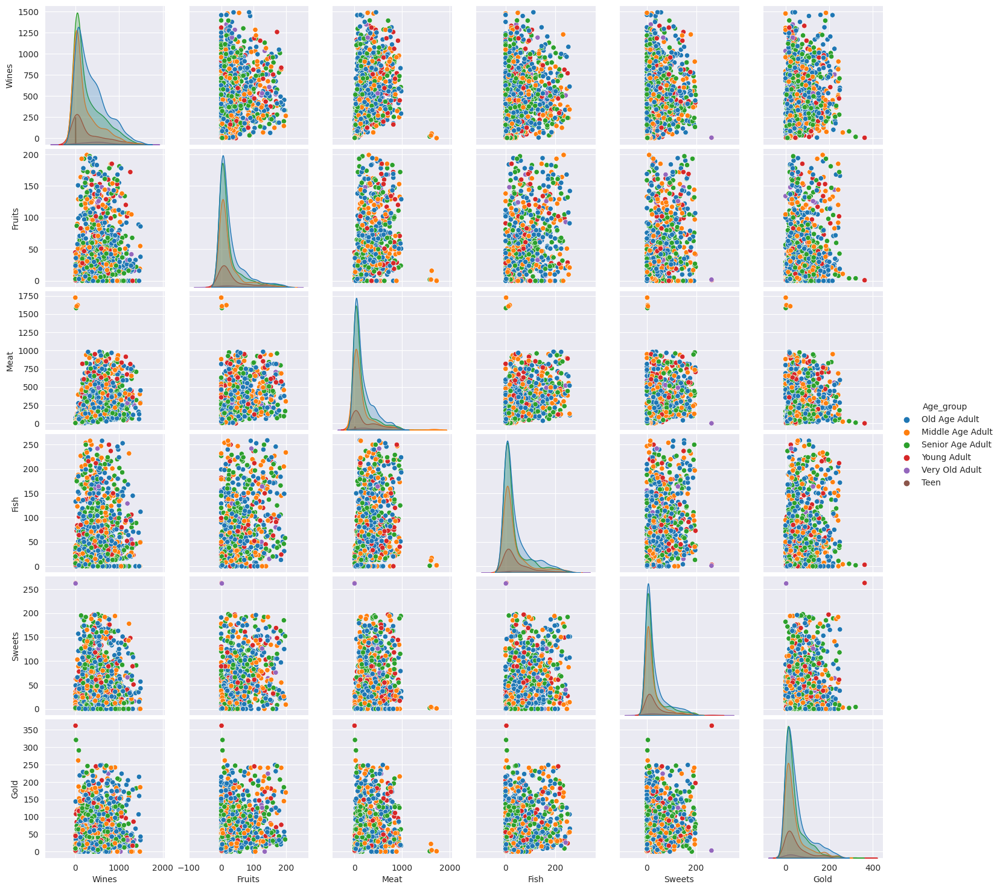

In [28]:
cols=['Age_group','Wines','Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

sns.set_style('darkgrid')
sns.pairplot(data[cols],hue = 'Age_group')
plt.show()

- Senior Age Adults spend more on Wines as compared to middle and old age.
- Teens spend the most on wines than other products.
- Senior and Old age adults are most likely to buy fruits.
- Middle aged adults have a similar spending pattern but spend the most on wines.

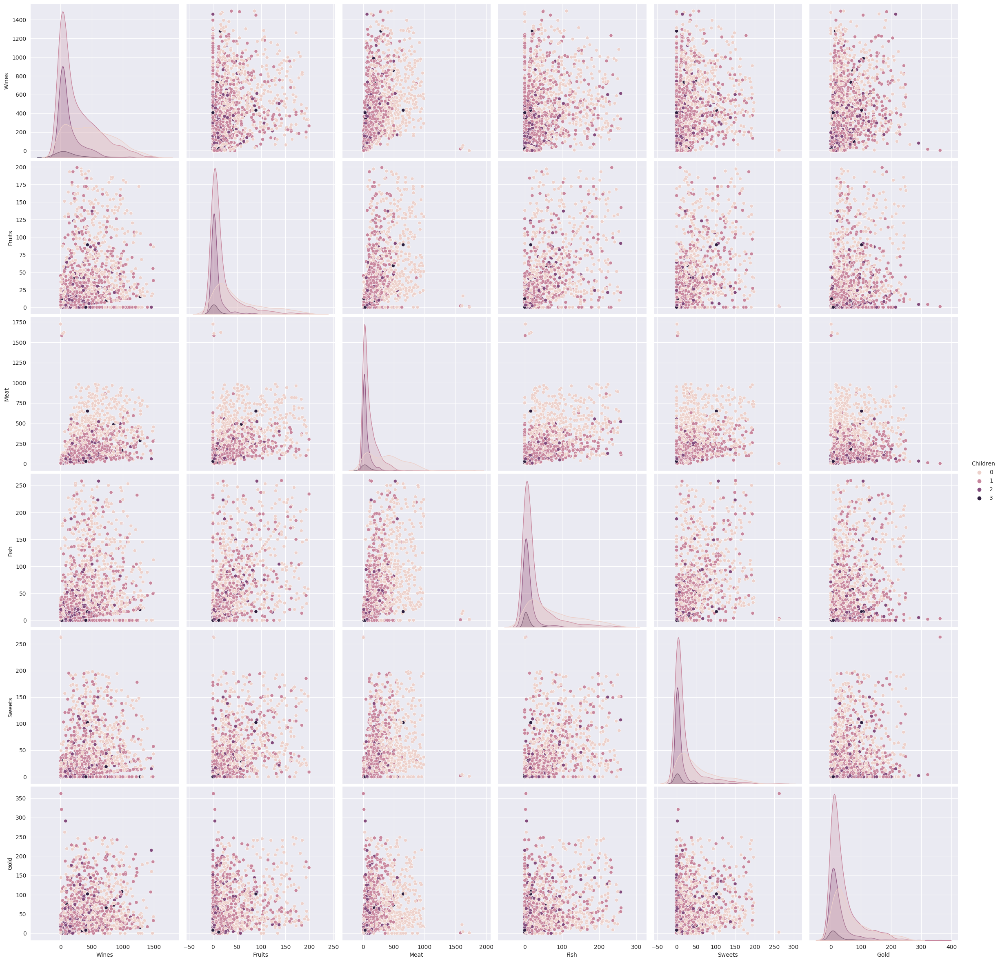

In [29]:
cols=['Children', 'Wines','Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

sns.set_style('darkgrid')
sns.pairplot(data[cols], hue ='Children', size = 4)
plt.show()

- Customers having 1 child at home Spend the highest on all Products.
- Customers having 3 children spend lowest on all products.

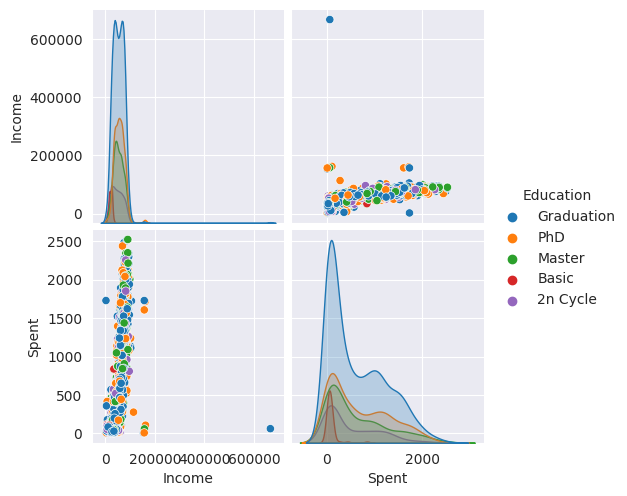

In [30]:
cols=['Income','Spent','Education']

sns.set_style('darkgrid')
sns.pairplot(data[cols],hue ='Education')
plt.show()

- Customers who have Graduation tend to have the highest income and Expenditure in total of all
- Customers who have PHD earn more than Masters Degree Holders.
- Despite of having a lower income Customers having Basic Education are most likely to spend as much as Masters and PHD holders.

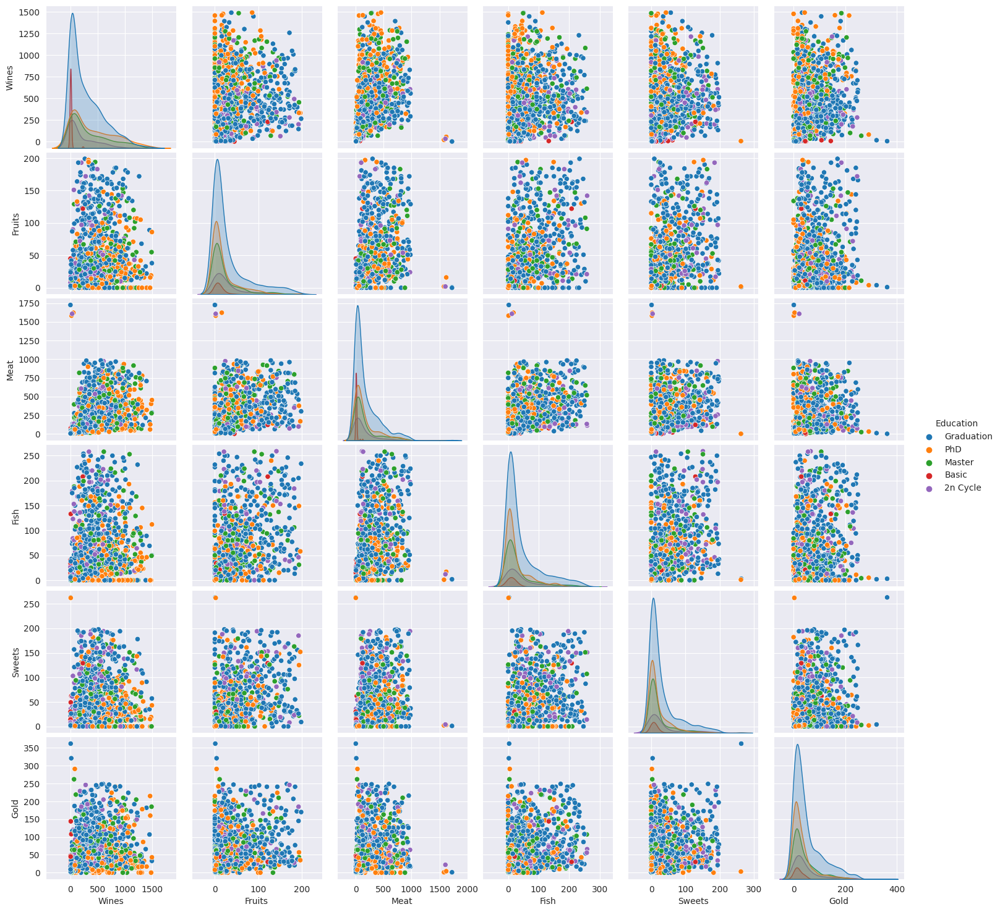

In [31]:
cols=['Education','Wines','Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

sns.set_style('darkgrid')
sns.pairplot(data[cols],hue = 'Education')
plt.show()

- Customers who have Basic Education spend more on Wines and Meat than other products.
- Customers with a Graduation spend the Highest on all products than any other educated customer.

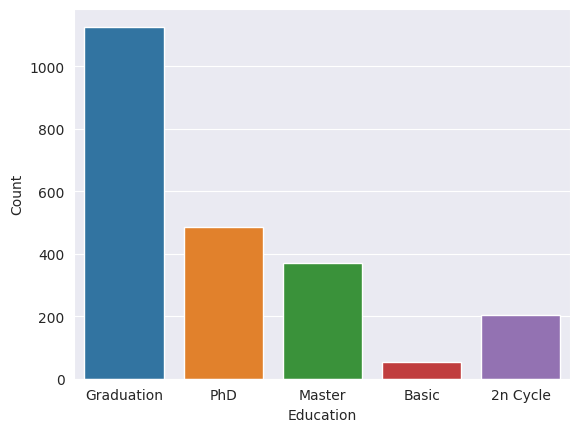

In [32]:
sns.countplot(data=data,x='Education')
plt.xlabel("Education")
plt.ylabel("Count")
plt.show()

- Most of the customers are graduate.

Text(0.5, 1.0, 'DONUT CHART')

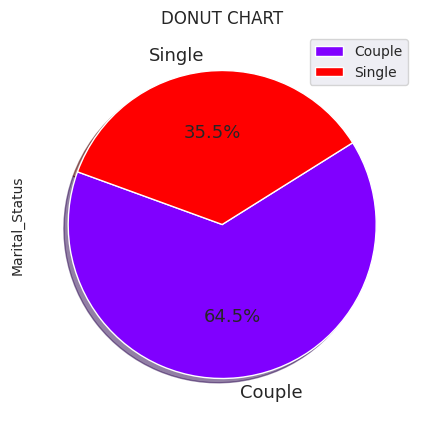

In [33]:
space= [0,0]
data['Marital_Status'].value_counts().plot(kind='pie',explode=space,fontsize=13,autopct='%2.1f%%',
                       shadow=True,startangle=160,figsize=(5,5),cmap='rainbow',legend=True)
labels=['Single','Couple']
plt.title('DONUT CHART')

- So, there are far more couple (64.6%) than singles (35.4%)
in terms of Marital_Status.

<Axes: >

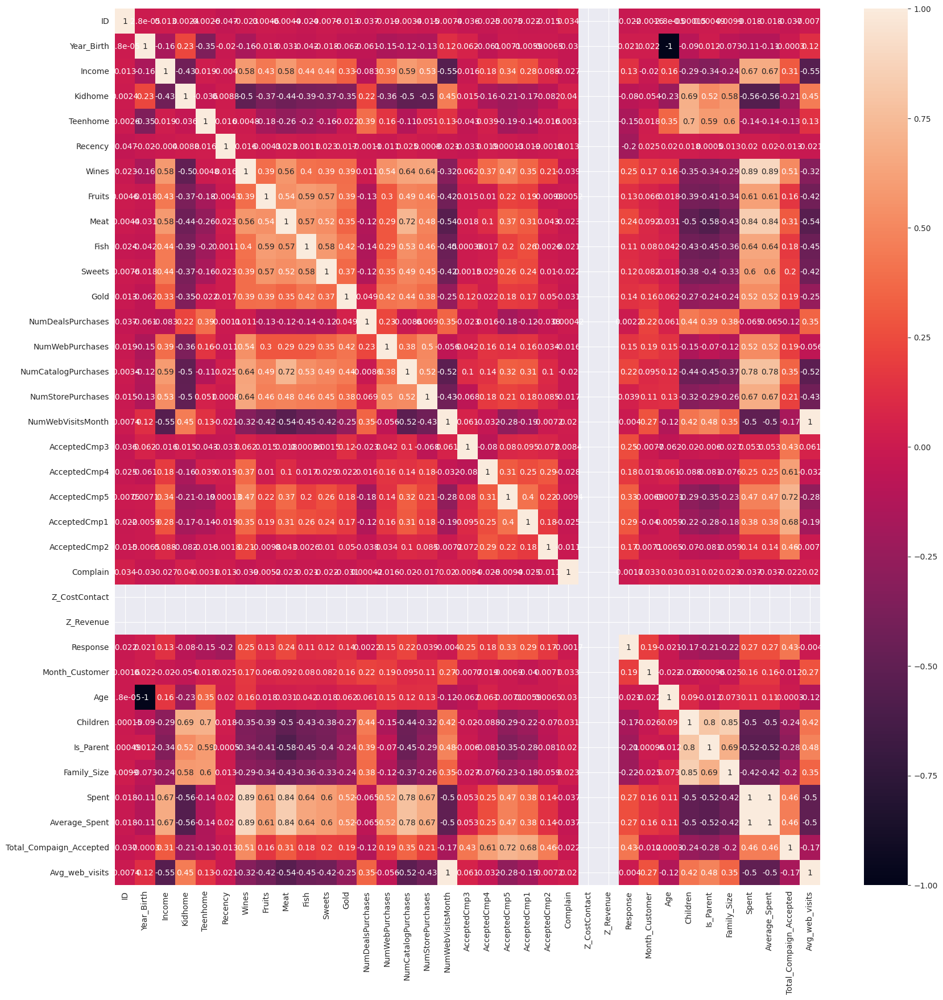

In [34]:
plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),annot=True)

- Z_CostContact and Z_Revenue have the same values in all rows ,so they won't contribute anything to the model building .

**Encoding Categorical Data**

In [35]:
data['Education'].value_counts()

Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: Education, dtype: int64

In [36]:
data['Marital_Status'].value_counts()

Couple    1444
Single     796
Name: Marital_Status, dtype: int64

In [37]:
cat_col=['Education']

label=LabelEncoder()
for i in cat_col:
  data[i]=label.fit_transform(data[i])

In [38]:
data['Education'].unique()

array([2, 4, 3, 1, 0])

**Removing Outliers**

In [39]:
data=data[(data['Age']<90)]
data=data[(data['Income']<600000)]

In [40]:
df=data.copy()

In [41]:
df.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response',
       'Month_Customer', 'Age', 'Age_group', 'Children', 'Is_Parent',
       'Family_Size', 'Spent', 'Average_Spent', 'Total_Compaign_Accepted',
       'Avg_web_visits'],
      dtype='object')

In [42]:
df.dtypes

ID                                  int64
Year_Birth                          int64
Education                           int64
Marital_Status                     object
Income                            float64
Kidhome                             int64
Teenhome                            int64
Dt_Customer                datetime64[ns]
Recency                             int64
Wines                               int64
Fruits                              int64
Meat                                int64
Fish                                int64
Sweets                              int64
Gold                                int64
NumDealsPurchases                   int64
NumWebPurchases                     int64
NumCatalogPurchases                 int64
NumStorePurchases                   int64
NumWebVisitsMonth                   int64
AcceptedCmp3                        int64
AcceptedCmp4                        int64
AcceptedCmp5                        int64
AcceptedCmp1                      

In [43]:
df=df.drop(['ID','Year_Birth','Dt_Customer','Z_CostContact', 'Z_Revenue','Marital_Status','Age_group'],axis=1)

**Feature Scaling**

In [44]:
sc=StandardScaler()
sc.fit(df)
scaled_df=pd.DataFrame(sc.transform(df))

**Dimensionality Reduction**

We'll employ PCA(Principal Components Analysis) to reduce the number of features in our dataset.

In [45]:
df.shape

(2212, 32)

In [46]:
pca=PCA()
scaled_df.dropna(inplace=True)
pca.fit(scaled_df)

PCA()

In [47]:
#Attributes shows how much varriance is explained by each of the individual components
pca.explained_variance_ratio_

array([3.21284598e-01, 9.53807862e-02, 8.18989516e-02, 5.99631623e-02,
       4.36593728e-02, 3.75144666e-02, 3.25889304e-02, 3.16267591e-02,
       3.14595764e-02, 2.64637313e-02, 2.48755203e-02, 2.18620385e-02,
       2.04275741e-02, 1.91744519e-02, 1.83729693e-02, 1.78757084e-02,
       1.69595322e-02, 1.48322524e-02, 1.39563370e-02, 1.32076786e-02,
       1.15996840e-02, 1.08625613e-02, 8.54908298e-03, 7.60681830e-03,
       6.98976402e-03, 6.13401914e-03, 4.87367248e-03, 6.33622148e-32,
       4.21136178e-33, 3.05095245e-33, 1.91298254e-33, 1.74772325e-33])

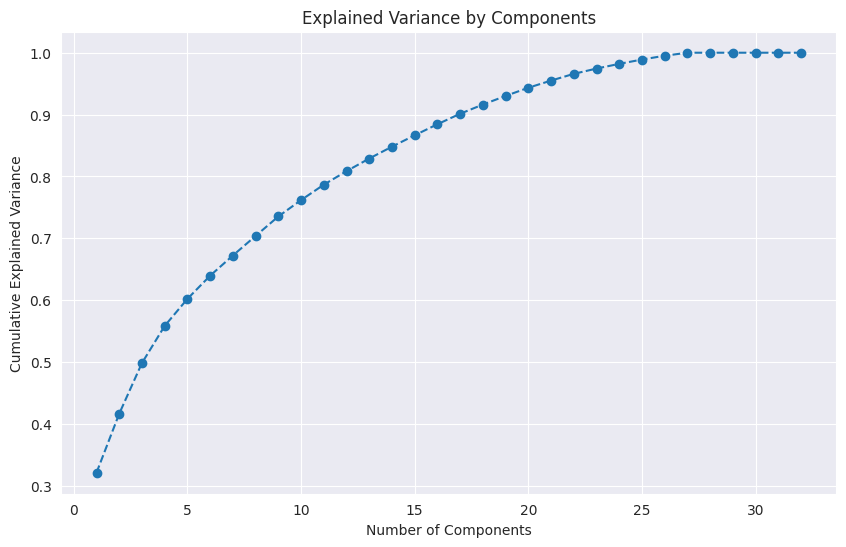

In [48]:
plt.figure(figsize=(10,6))
plt.plot(range(1,33),pca.explained_variance_ratio_.cumsum(),marker='o',linestyle= '--')
plt.title('Explained Variance by Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [49]:
pca=PCA(n_components=3)
scaled_df.dropna(inplace=True)
pca.fit(scaled_df)

PCA(n_components=3)

In [50]:
pca_scores=pd.DataFrame(pca.transform(scaled_df),columns=(['col1','col2','col3']))

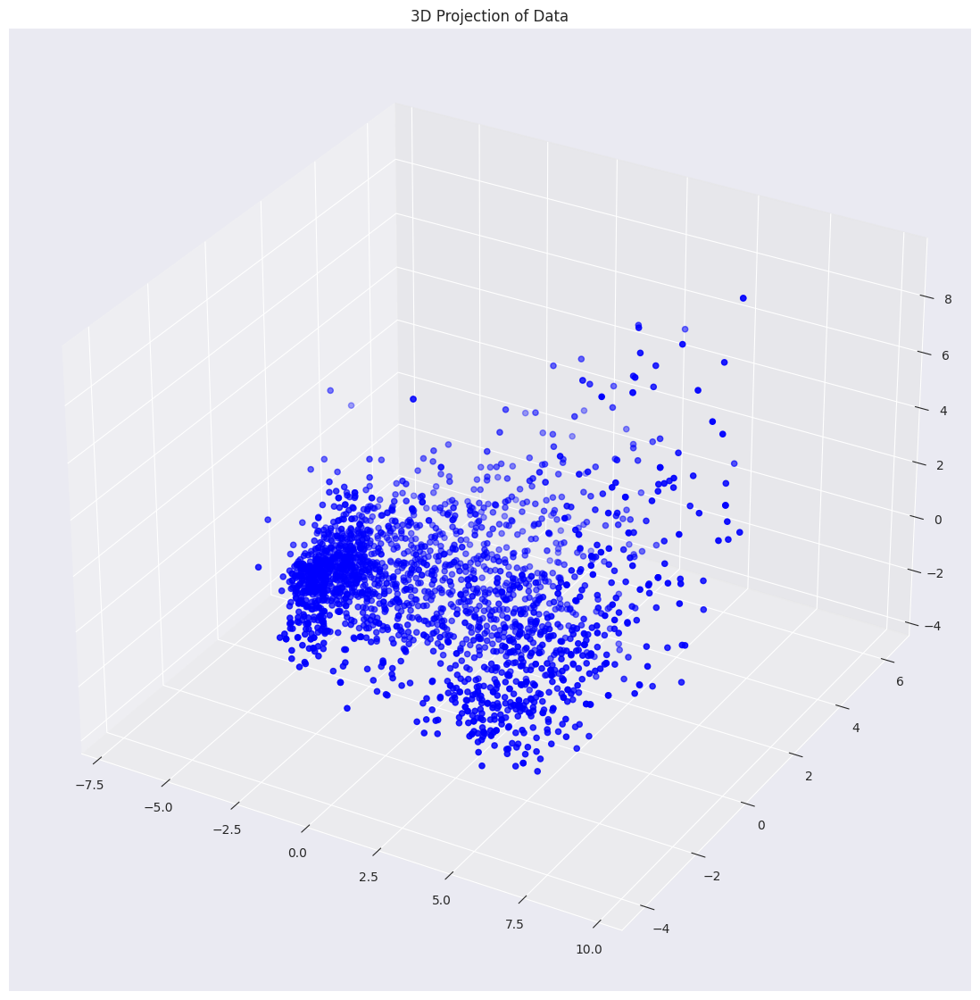

In [51]:
x=pca_scores['col1']
y=pca_scores['col2']
z=pca_scores['col3']

fig=plt.figure(figsize=(18,14))
ax=fig.add_subplot(111,projection='3d')
ax.scatter(x,y,z,c='b',marker='o')
ax.set_title('3D Projection of Data')
plt.show()

**Clustering**

**KMeans Clustering**

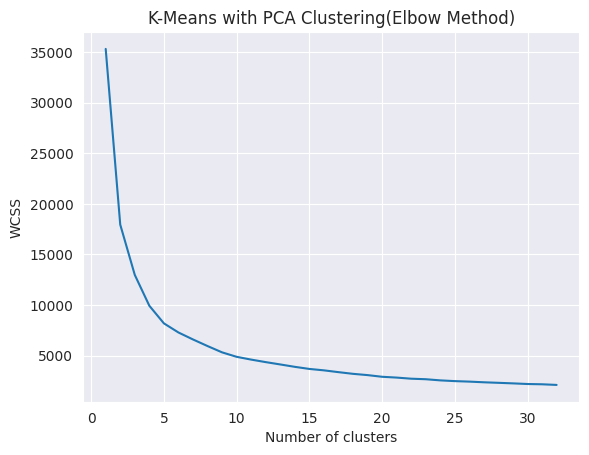

In [52]:
wcss = []
for i in range(1,33):
    kmeans_pca = KMeans(n_clusters=i,random_state=0)
    kmeans_pca.fit(pca_scores)
    wcss.append(kmeans_pca.inertia_)

plt.plot(range(1,33), wcss)
plt.title('K-Means with PCA Clustering(Elbow Method)')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [53]:
kmeans_pca = KMeans(5, random_state=0)
kmeans_pca.fit(pca_scores)

KMeans(n_clusters=5, random_state=0)

In [54]:
kmeans_pca.labels_

array([3, 1, 3, ..., 3, 0, 1], dtype=int32)

In [55]:
from sklearn.metrics import silhouette_score
silhouette_score=silhouette_score(pca_scores,kmeans_pca.labels_,metric='euclidean')
silhouette_score

0.3576113379953554

In [56]:
kmeans_pca1 = KMeans(4, random_state=0)
kmeans_pca1.fit(pca_scores)

KMeans(n_clusters=4, random_state=0)

In [57]:
data['KMean_cluster']=kmeans_pca1.labels_

In [58]:
kmeans_pca1.labels_

array([1, 0, 1, ..., 1, 3, 0], dtype=int32)

In [59]:
from sklearn.metrics import silhouette_score
silhouette_score=silhouette_score(pca_scores,kmeans_pca1.labels_,metric='euclidean')
silhouette_score

0.42022125512083275

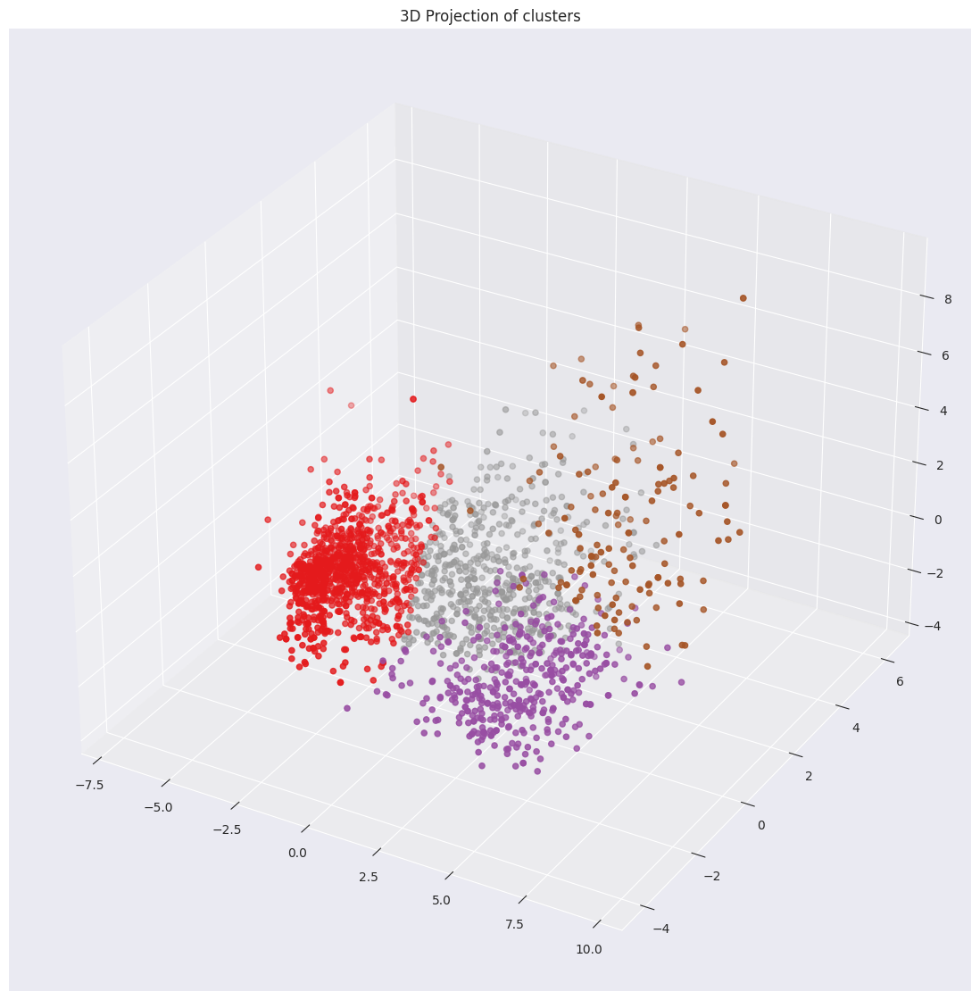

In [60]:
fig=plt.figure(figsize=(18,14))
ax=fig.add_subplot(111,projection='3d')
ax.scatter(x,y,z,c=kmeans_pca1.labels_,marker='o',cmap='Set1')
ax.set_title('3D Projection of clusters')
plt.show()

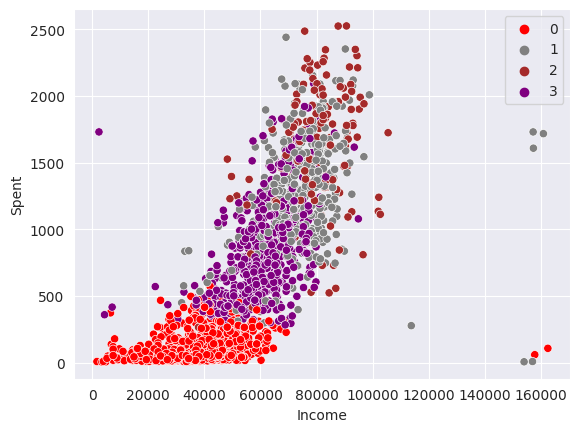

In [61]:
sns.scatterplot(data=data,x=data['Income'],y=data['Spent'],hue=kmeans_pca1.labels_,palette=['red','gray','brown','purple'])
plt.legend()
plt.show()

- Cluster 0 : Low Income Low Spending
- Cluster 1 : High-Middle Class
- Cluster 2 : High Income High Spending
- Cluster 3 : Low-Middle Class

**Data Points Distribution using KMeans**

Text(0.5, 1.0, 'DONUT CHART')

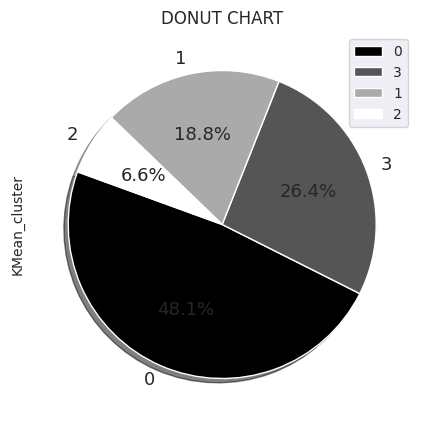

In [62]:
data['KMean_cluster'].value_counts().plot(kind='pie',fontsize=13,autopct='%2.1f%%',
                       shadow=True,startangle=160,figsize=(5,5),cmap='gray',legend=True)
labels=['0','1','2','3']
plt.title('DONUT CHART')

In [92]:
data.groupby(['KMean_cluster']).mean()

,ID,Year_Birth,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Month_Customer,Age,Children,Is_Parent,Family_Size,Spent,Average_Spent,Total_Compaign_Accepted,Avg_web_visits,db_clusterid,h_clusterid
KMean_cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,5596.442254,1971.416901,2.283568,35022.818779,0.777465,0.461033,48.953052,47.768075,5.100469,24.959624,7.600000,5.144601,16.333333,2.120188,2.253521,0.578404,3.282629,6.505164,0.073239,0.011268,0.000000,0.000000,0.001878,0.011268,3.0,11.0,0.093897,17.308920,43.583099,1.238498,0.880751,2.889202,106.906103,17.817684,0.086385,0.542097,-0.037559,1.690141
1,5647.240385,1967.610577,2.382212,74317.728365,0.009615,0.081731,50.524038,508.098558,67.423077,445.038462,100.334135,68.899038,74.456731,1.211538,4.826923,5.764423,8.283654,2.598558,0.036058,0.028846,0.098558,0.086538,0.000000,0.004808,3.0,11.0,0.165865,17.853365,47.389423,0.091346,0.091346,1.687500,1264.250000,210.708333,0.250000,0.216546,0.668269,0.959135
2,5539.000000,1970.925170,2.557823,79768.394558,0.054422,0.156463,45.802721,915.952381,50.551020,436.931973,75.306122,59.585034,76.136054,1.217687,5.571429,6.020408,8.156463,3.571429,0.217687,0.510204,0.775510,0.605442,0.190476,0.006803,3.0,11.0,0.714286,19.000000,44.074830,0.210884,0.197279,1.816327,1614.462585,269.077098,2.299320,0.297619,-0.653061,2.408163
3,5531.986301,1964.770548,2.568493,59916.880137,0.234589,0.977740,48.878425,476.727740,29.674658,160.142123,38.315068,28.984589,64.388699,3.768836,6.534247,3.445205,8.053082,5.542808,0.065068,0.111301,0.010274,0.029110,0.000000,0.008562,3.0,11.0,0.101027,19.869863,50.229452,1.212329,0.984589,2.893836,798.232877,133.038813,0.215753,0.461901,-0.155822,0.000000


**KMeans_Clusters GroupBy their Spending habits**

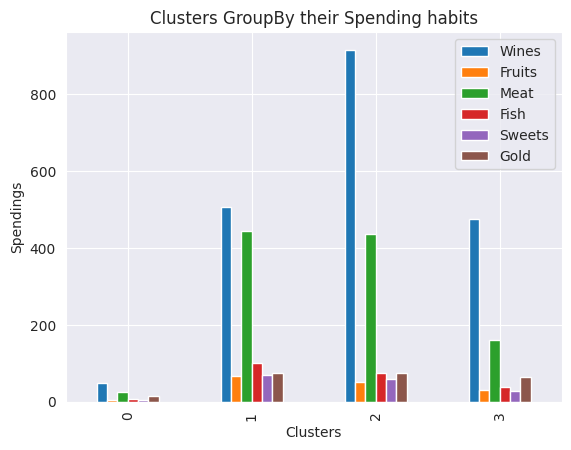

In [64]:
cluster_spendings=data.groupby('KMean_cluster')[['Wines', 'Fruits', 'Meat', 'Fish','Sweets', 'Gold']].mean()
cluster_spendings.plot(kind='bar')

plt.title('Clusters GroupBy their Spending habits')
plt.xlabel('Clusters')
plt.ylabel('Spendings')
plt.show()

**KMeans_Clusters GroupBy their Purchasing habits**

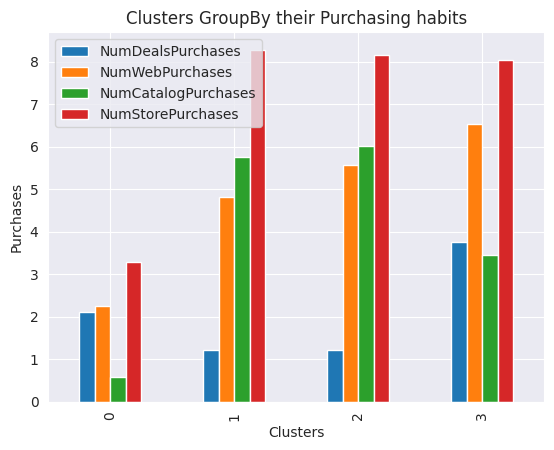

In [65]:
cluster_purchases=data.groupby('KMean_cluster')[['NumDealsPurchases', 'NumWebPurchases',
                                                 'NumCatalogPurchases', 'NumStorePurchases']].mean()
cluster_purchases.plot(kind='bar')

plt.title('Clusters GroupBy their Purchasing habits')
plt.xlabel('Clusters')
plt.ylabel('Purchases')
plt.show()

Almost all the customers prefer mostly to visit shop and Purchase.

**DBSCAN**

In [66]:
#Finding Out Epsilon
from sklearn.neighbors import NearestNeighbors
neigh = NearestNeighbors(n_neighbors=2)
nbrs = neigh.fit(pca_scores)
distances, indices = nbrs.kneighbors(pca_scores)

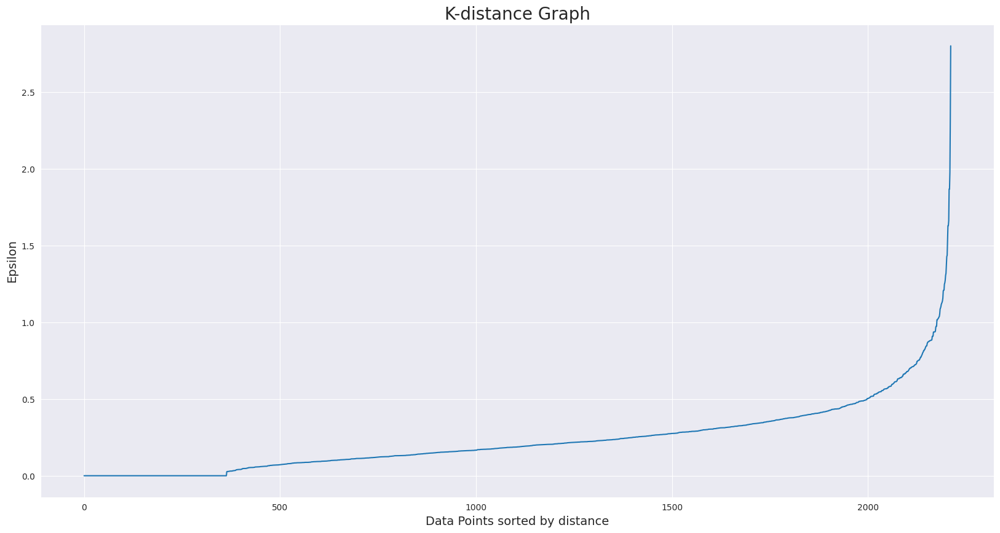

In [67]:
# Plotting K-distance Graph
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.figure(figsize=(20,10))
plt.plot(distances)
plt.title('K-distance Graph',fontsize=20)
plt.xlabel('Data Points sorted by distance',fontsize=14)
plt.ylabel('Epsilon',fontsize=14)
plt.show()

In [68]:
from sklearn.cluster import DBSCAN
dbscan=DBSCAN(eps=0.8,min_samples=12)
dbscan.fit(pca_scores)

DBSCAN(eps=0.8, min_samples=12)

In [69]:
data['db_clusterid'] =dbscan.labels_

In [70]:
data['db_clusterid'].value_counts()

 0    1560
 1     326
-1     309
 2      17
Name: db_clusterid, dtype: int64

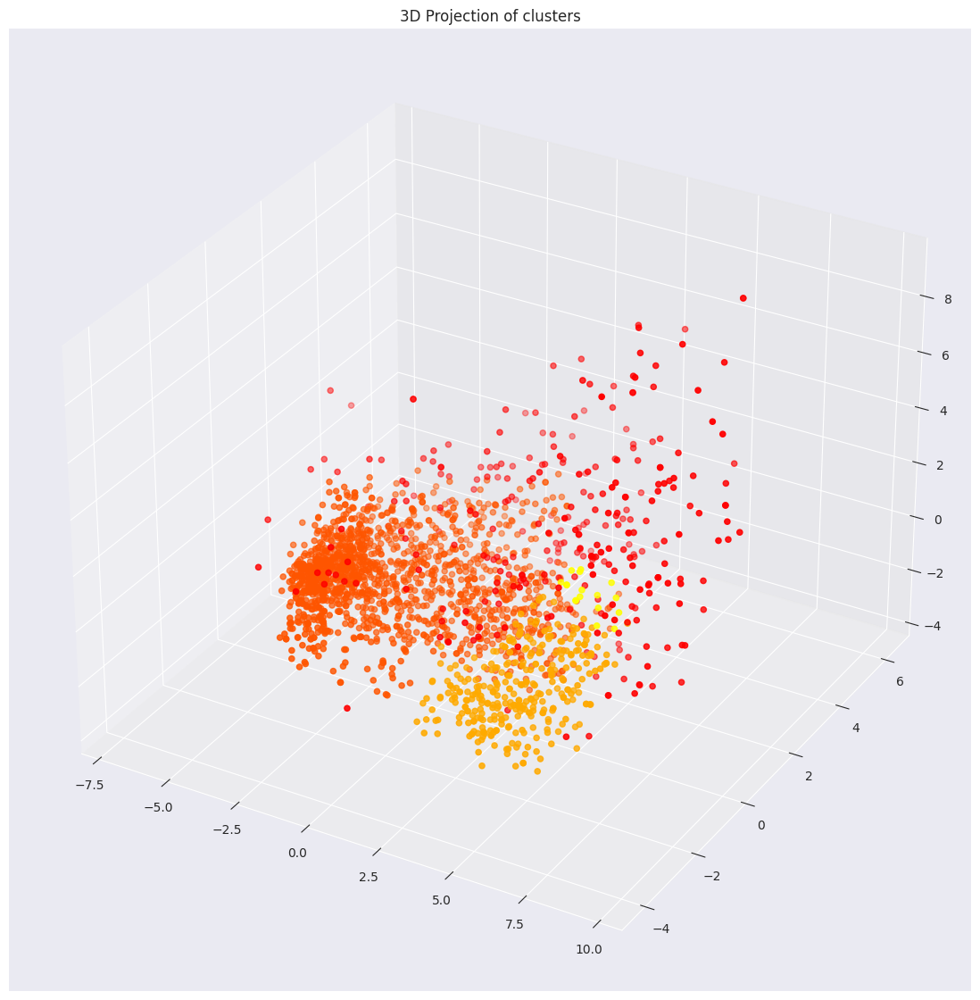

In [71]:
fig=plt.figure(figsize=(18,14))
ax=fig.add_subplot(111,projection='3d')
ax.scatter(x,y,z,c=data['db_clusterid'],marker='o',cmap='autumn')
ax.set_title('3D Projection of clusters')
plt.show()

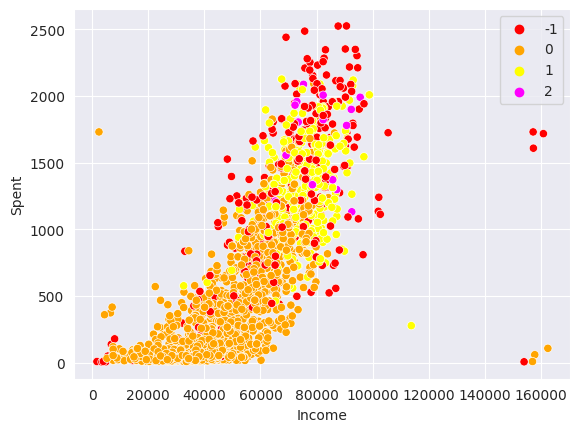

In [72]:
sns.scatterplot(data=data,x=data['Income'],y=data['Spent'],hue=data['db_clusterid'],palette=['red','orange','yellow','magenta'])
plt.legend()
plt.show()

In [73]:
from sklearn.metrics import silhouette_score
silhouette_score=silhouette_score(pca_scores,dbscan.labels_,metric='euclidean')
silhouette_score

0.3179787560478836

**Data Points Distribution using DBSCAN**

Text(0.5, 1.0, 'DONUT CHART')

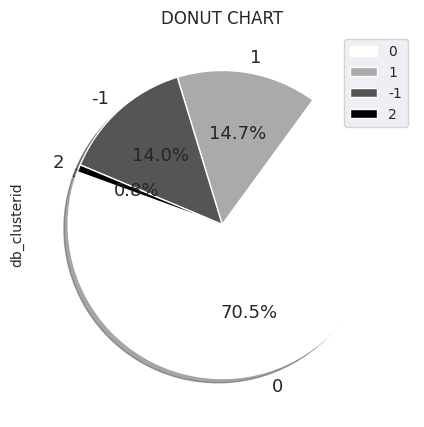

In [74]:
data['db_clusterid'].value_counts().plot(kind='pie',fontsize=13,autopct='%2.1f%%',
                       shadow=True,startangle=160,figsize=(5,5),cmap='gist_yarg',legend=True)
labels=['0','1','2','3']
plt.title('DONUT CHART')

In [75]:
data.groupby(['db_clusterid']).mean()

,ID,Year_Birth,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Month_Customer,Age,Children,Is_Parent,Family_Size,Spent,Average_Spent,Total_Compaign_Accepted,Avg_web_visits,KMean_cluster
db_clusterid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,5382.592233,1967.760518,2.618123,67535.472492,0.255663,0.472492,47.614887,680.071197,39.572816,310.495146,57.430421,44.177994,67.103560,2.815534,5.699029,4.883495,7.268608,5.184466,0.226537,0.375405,0.368932,0.339806,0.097087,0.009709,3.0,11.0,0.527508,19.847896,47.239482,0.728155,0.485437,2.346278,1198.851133,199.808522,1.407767,0.432039,1.880259
0,5610.775000,1969.453846,2.358333,43760.162179,0.575000,0.623077,48.991026,179.974359,14.964103,71.242308,20.158974,15.072436,32.505128,2.510897,3.627564,1.542949,4.946795,5.993590,0.051923,0.025641,0.000000,0.001923,0.000000,0.009615,3.0,11.0,0.070513,17.987821,45.546154,1.198077,0.915385,2.858333,333.917308,55.652885,0.079487,0.499466,0.975000
1,5573.757669,1967.131902,2.346626,74941.128834,0.003067,0.003067,50.834356,517.371166,67.855828,471.015337,100.122699,66.923313,75.840491,1.039877,4.668712,5.828221,8.389571,2.371166,0.027607,0.021472,0.104294,0.085890,0.000000,0.006135,3.0,11.0,0.150307,17.598160,47.868098,0.006135,0.006135,1.610429,1299.128834,216.521472,0.239264,0.197597,1.000000
2,7135.352941,1974.470588,2.705882,80456.882353,0.000000,0.000000,42.352941,925.352941,32.235294,519.882353,85.000000,49.764706,58.647059,0.941176,5.941176,5.588235,8.588235,2.705882,0.176471,0.058824,0.764706,0.352941,0.000000,0.000000,3.0,11.0,0.647059,19.235294,40.529412,0.000000,0.000000,1.588235,1670.882353,278.480392,1.352941,0.225490,2.000000


**DNSCAN_Clusters GroupBy their Spending habits**

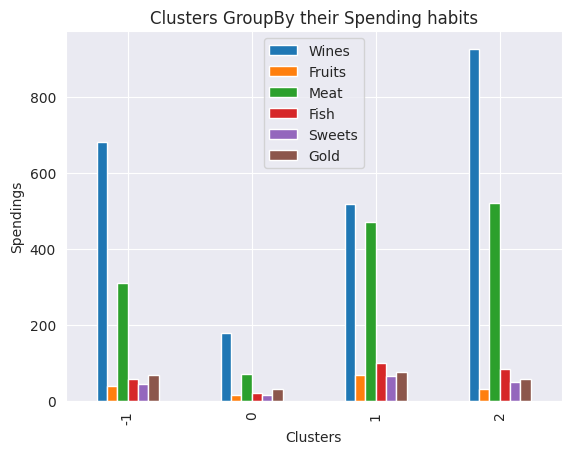

In [76]:
cluster_spendings=data.groupby('db_clusterid')[['Wines', 'Fruits', 'Meat', 'Fish','Sweets', 'Gold']].mean()
cluster_spendings.plot(kind='bar')

plt.title('Clusters GroupBy their Spending habits')
plt.xlabel('Clusters')
plt.ylabel('Spendings')
plt.show()

**DBSCAN_Clusters GroupBy their Purchasing habits**

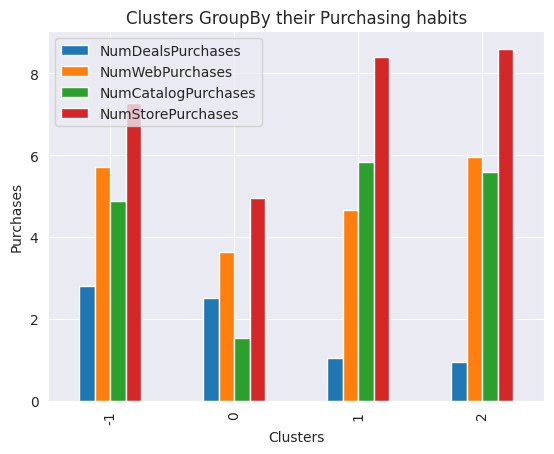

In [77]:
cluster_purchases=data.groupby('db_clusterid')[['NumDealsPurchases', 'NumWebPurchases',
                                                 'NumCatalogPurchases', 'NumStorePurchases']].mean()
cluster_purchases.plot(kind='bar')

plt.title('Clusters GroupBy their Purchasing habits')
plt.xlabel('Clusters')
plt.ylabel('Purchases')
plt.show()

**Agglomerative Clustering**

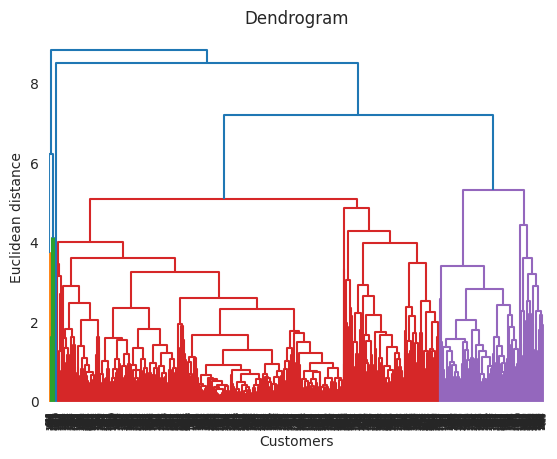

In [78]:
dendrogram=sch.dendrogram(sch.linkage(pca_scores,method='average'))
plt.title('Dendrogram')
plt.xlabel('Customers')
plt.ylabel('Euclidean distance')
plt.show()

In [79]:
hc = AgglomerativeClustering(n_clusters=5)
y_hc = hc.fit_predict(pca_scores)
pca_scores['h_clusterid']=y_hc

In [80]:
data['h_clusterid'] = hc.labels_

In [81]:
from sklearn.metrics import silhouette_score
silhouette_score=silhouette_score(pca_scores,hc.labels_,metric='euclidean')
silhouette_score

0.423449625604331

In [82]:
hc = AgglomerativeClustering(n_clusters=4)
y_hc = hc.fit_predict(pca_scores)
pca_scores['h_clusterid']=y_hc

In [83]:
data['h_clusterid'] = hc.labels_

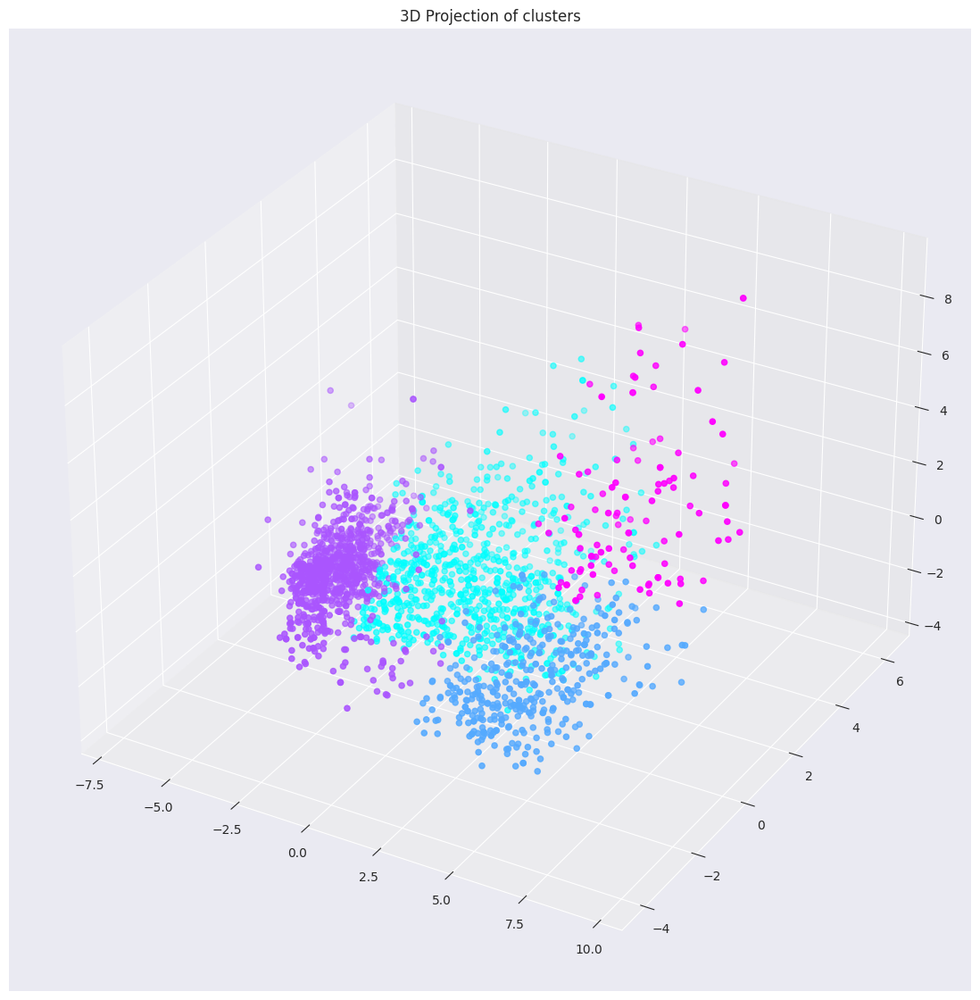

In [84]:
fig=plt.figure(figsize=(18,14))
ax=fig.add_subplot(111,projection='3d')
ax.scatter(x,y,z,c=pca_scores['h_clusterid'],marker='o',cmap='cool')
ax.set_title('3D Projection of clusters')
plt.show()

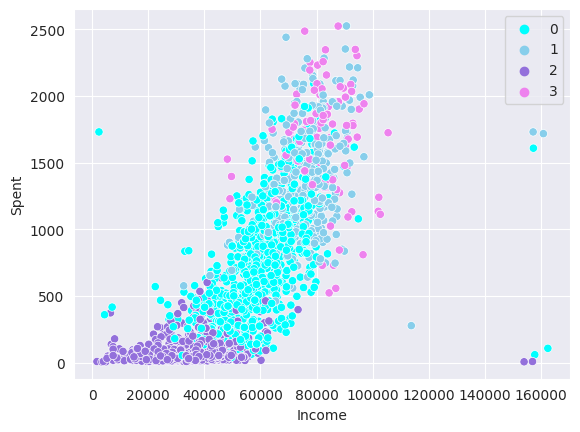

In [85]:
sns.scatterplot(data=data,x=data['Income'],y=data['Spent'],hue=data['h_clusterid'],palette=['cyan','skyblue','mediumpurple','violet'])
plt.legend()
plt.show()

In [86]:
from sklearn.metrics import silhouette_score
silhouette_score=silhouette_score(pca_scores,hc.labels_,metric='euclidean')
silhouette_score

0.4317572508847453

**Data Points Distribution using Agglomerative Clustering**

Text(0.5, 1.0, 'DONUT CHART')

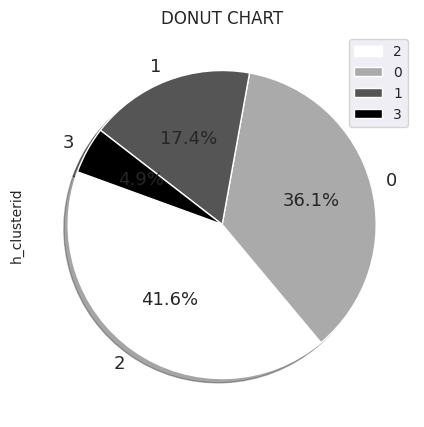

In [87]:
data['h_clusterid'].value_counts().plot(kind='pie',fontsize=13,autopct='%2.1f%%',
                       shadow=True,startangle=160,figsize=(5,5),cmap='binary',legend=True)
labels=['0','1','2','3']
plt.title('DONUT CHART')

In [88]:
data.groupby(['h_clusterid']).mean()

,ID,Year_Birth,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Month_Customer,Age,Children,Is_Parent,Family_Size,Spent,Average_Spent,Total_Compaign_Accepted,Avg_web_visits,KMean_cluster,db_clusterid
h_clusterid,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,5508.298246,1964.992481,2.546366,58413.474937,0.273183,0.932331,49.041353,411.525063,27.367168,144.350877,36.773183,27.897243,58.241855,3.511278,5.931078,3.115288,7.382206,5.492481,0.055138,0.105263,0.013784,0.025063,0.007519,0.006266,3.0,11.0,0.101504,19.438596,50.007519,1.205514,0.967419,2.890977,706.155388,117.692565,0.206767,0.457707,2.273183,-0.144110
1,5704.513021,1967.442708,2.375000,75687.640625,0.005208,0.013021,49.963542,552.924479,68.416667,487.518229,101.919271,67.747396,76.013021,1.078125,4.765625,5.953125,8.364583,2.442708,0.052083,0.033854,0.140625,0.130208,0.000000,0.005208,3.0,11.0,0.205729,17.859375,47.557292,0.018229,0.018229,1.604167,1354.539062,225.756510,0.356771,0.203559,1.059896,0.734375
2,5610.773073,1972.622150,2.250814,33003.243214,0.815418,0.388708,48.867535,34.610206,5.047774,21.661238,7.352877,5.110749,14.536374,1.961998,2.015201,0.497286,3.100977,6.598263,0.079262,0.008686,0.000000,0.001086,0.003257,0.013029,3.0,11.0,0.094463,17.169381,42.377850,1.204126,0.851249,2.840391,88.319218,14.719870,0.092291,0.549855,0.024973,-0.043431
3,5511.000000,1971.467890,2.587156,81274.266055,0.055046,0.110092,46.816514,942.201835,50.284404,432.302752,73.623853,62.779817,74.403670,1.091743,5.724771,6.247706,8.119266,3.422018,0.238532,0.541284,0.880734,0.651376,0.192661,0.009174,3.0,11.0,0.788991,19.036697,43.532110,0.165138,0.155963,1.807339,1635.596330,272.599388,2.504587,0.285168,2.000000,-0.697248


**Agglomerative Clusters GroupBy their Spending habits**

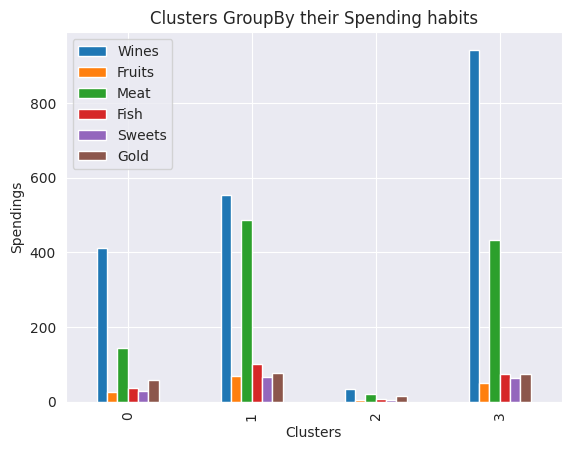

In [89]:
cluster_spendings=data.groupby('h_clusterid')[['Wines', 'Fruits', 'Meat', 'Fish','Sweets', 'Gold']].mean()
cluster_spendings.plot(kind='bar')

plt.title('Clusters GroupBy their Spending habits')
plt.xlabel('Clusters')
plt.ylabel('Spendings')
plt.show()

**Agglomerative Clusters GroupBy their Purchasing habits**

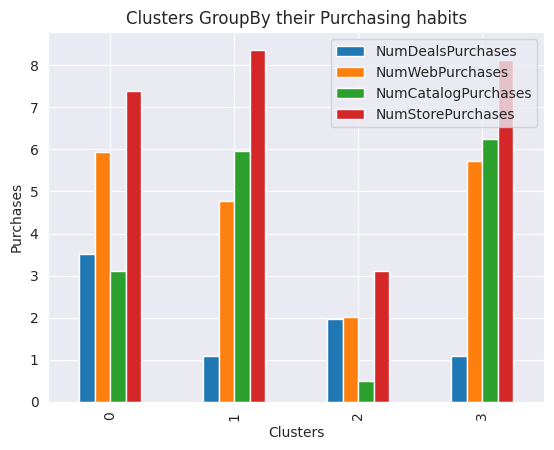

In [90]:
cluster_purchases=data.groupby('h_clusterid')[['NumDealsPurchases', 'NumWebPurchases',
                                                 'NumCatalogPurchases', 'NumStorePurchases']].mean()
cluster_purchases.plot(kind='bar')

plt.title('Clusters GroupBy their Purchasing habits')
plt.xlabel('Clusters')
plt.ylabel('Purchases')
plt.show()